In [191]:
import requests
import pandas as pd
import numpy as np

from pandas.tseries.offsets import DateOffset
from statsmodels.tsa.seasonal import seasonal_decompose
from pandas.tseries.offsets import DateOffset

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error

import matplotlib.pyplot as plt

from statsmodels.tsa.arima.model import ARIMA
import time
from xgboost import XGBRegressor
import json
from scipy.fft import fft
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller


# 1. IMPORTING DATA

In [3]:
# Making request to API
def request_data(country: str, start: str, end: str):

  base_url = "https://api.energy-charts.info/total_power'
  params = {
      'country': country,
      'start': start,
      'end': end
  }

  response = requests.get(url = base_url, params = params)

  return response

response = request_data(country='de', start='2015-01-01T00:00Z', end='2024-09-01T00:00Z')
resp_json = response.json()

save_file = open('data.json', 'w')  
json.dump(resp_json, save_file)  
save_file.close() 

In [5]:
# Data was previously saved
with open('data.json') as f:
    resp_json = json.load(f)

# 2.EDA & FEATURE ENGINEERING

## 2.1. Exploratory Data Analysis

### 2.1.1. Preprocessing

In [223]:
# Transform response to a df
data = {
    "Datetime" : resp_json["unix_seconds"]
}

for i in resp_json["production_types"]:
  if (i["name"] == "Wind onshore") or (i["name"] == "Solar") or (i["name"] == "Wind offshore"):
    data[i["name"]] = i["data"]

df = pd.DataFrame.from_dict(data)
df

,Datetime,Wind offshore,Wind onshore,Solar
0,1420070400,520.3,9080.1,0.0
1,1420071300,521.8,9191.6,0.0
2,1420072200,521.0,9174.4,0.0
3,1420073100,519.9,9209.3,0.0
4,1420074000,520.8,9342.1,0.0
...,...,...,...,...
338972,1725145200,3017.8,14455.5,0.0
338973,1725146100,3055.3,14240.9,0.0
338974,1725147000,2883.1,14175.4,0.0
338975,1725147900,2682.8,14248.8,0.0


In [224]:
# Transform response to a df
data = {
    "Datetime" : resp_json["unix_seconds"]
}

for i in resp_json["production_types"]:
  if (i["name"] == "Wind onshore") or (i["name"] == "Solar") or (i["name"] == "Wind offshore"):
    data[i["name"]] = i["data"]

df = pd.DataFrame.from_dict(data)

# Getting total power produced from all three energy sources
df['Total power'] = df.loc[:, df.columns != "Datetime"].apply(np.sum, axis=1)

# Convert to datetime and local timezone
df['Datetime'] = pd.to_datetime(df['Datetime'], unit='s')
df['Datetime'] = df['Datetime'].dt.tz_localize("UTC")
df['Datetime'] = df['Datetime'].dt.tz_convert(tz = 'Europe/Berlin')

df = df.set_index('Datetime')

# Get hourly data as prediction will be per hour
df = df.resample('1h').sum()

In [225]:
df

,Wind offshore,Wind onshore,Solar,Total power
Datetime,,,,
2015-01-01 01:00:00+01:00,2083.0,36655.4,0.0,38738.4
2015-01-01 02:00:00+01:00,2076.0,37263.4,0.0,39339.4
2015-01-01 03:00:00+01:00,2090.0,37062.4,0.0,39152.4
2015-01-01 04:00:00+01:00,2098.3,37294.1,0.0,39392.4
2015-01-01 05:00:00+01:00,2097.4,38539.5,0.0,40636.9
...,...,...,...,...
2024-08-31 22:00:00+02:00,12782.9,61676.5,0.0,74459.4
2024-08-31 23:00:00+02:00,12281.4,61475.8,0.0,73757.2
2024-09-01 00:00:00+02:00,10666.8,59812.4,0.0,70479.2


### 2.1.2. STATS

In [41]:
# Get info on the dataset
print('First 20 rows of dataframe:')
display(df.head(15))
print('\n')
print('Last 20 rows of dataframe:')
display(df.tail(15))
print('\n')
print('Discriptive Statistics:')
display(df.describe())
print('\n')
print('NaN Values in the dataframe:')
display(df.isnull().sum())
print('\n')
print('Data types in our dataframe:')
display(df.dtypes)

First 20 rows of dataframe:


,Wind offshore,Wind onshore,Solar,Total power
Datetime,,,,
2015-01-01 01:00:00+01:00,2083.0,36655.4,0.0,38738.4
2015-01-01 02:00:00+01:00,2076.0,37263.4,0.0,39339.4
2015-01-01 03:00:00+01:00,2090.0,37062.4,0.0,39152.4
2015-01-01 04:00:00+01:00,2098.3,37294.1,0.0,39392.4
2015-01-01 05:00:00+01:00,2097.4,38539.5,0.0,40636.9
2015-01-01 06:00:00+01:00,2104.3,40636.1,0.0,42740.4
2015-01-01 07:00:00+01:00,2101.6,42797.5,0.0,44899.1
2015-01-01 08:00:00+01:00,2121.1,42697.2,227.4,45045.7
2015-01-01 09:00:00+01:00,2130.0,42825.3,3309.8,48265.1




Last 20 rows of dataframe:


,Wind offshore,Wind onshore,Solar,Total power
Datetime,,,,
2024-08-31 12:00:00+02:00,1868.8,20183.1,170217.5,192269.4
2024-08-31 13:00:00+02:00,2064.1,18723.4,175538.8,196326.3
2024-08-31 14:00:00+02:00,1142.2,18746.5,168096.4,187985.1
2024-08-31 15:00:00+02:00,1649.2,23016.3,148442.6,173108.1
2024-08-31 16:00:00+02:00,3276.5,24707.4,117019.1,145003.0
2024-08-31 17:00:00+02:00,6937.8,27925.8,76221.0,111084.6
2024-08-31 18:00:00+02:00,9169.1,30674.9,34171.6,74015.6
2024-08-31 19:00:00+02:00,10189.1,34574.7,6972.7,51736.5
2024-08-31 20:00:00+02:00,10666.1,47502.6,66.2,58234.9




Discriptive Statistics:


,Wind offshore,Wind onshore,Solar,Total power
count,84745.000000,84745.000000,84745.000000,84745.000000
mean,9313.051680,41845.329175,22290.528173,73448.909027
std,7100.631966,34569.721717,34712.620331,47455.104666
min,0.000000,300.400000,0.000000,984.500000
25%,2980.400000,15338.700000,0.000000,34490.400000
50%,8026.400000,31201.200000,748.000000,64855.300000
75%,14752.000000,59260.500000,35349.400000,105342.000000
max,30548.200000,191455.400000,210819.100000,288959.200000




NaN Values in the dataframe:


Wind offshore    0
Wind onshore     0
Solar            0
Total power      0
dtype: int64



Data types in our dataframe:


Wind offshore    float64
Wind onshore     float64
Solar            float64
Total power      float64
dtype: object

### 2.1.3. PLOT

#### Useful Functions

In [126]:
c_br_green1 = '#76FF78'
c_br_green2 = '#90EE90'
c_br_green3 = '#9ACD32'
c_turq = '#06C2AC'
c_dark_green = '#054907'
c_yellow = '#FFD700'
c_blue = '#7BC8F6'

In [153]:
# Plot functions

def plot_data(df, ttl, linewidth, color, fig_sz):

    plt.style.use("ggplot")
    plt.rcParams.update({'figure.figsize': fig_sz})
    ax = df.plot(title=ttl, linewidth = linewidth, c=color)

    set_label(ax)

def plot_data_2(condition, title, linewidth):
    
    plt.style.use("ggplot")
    plt.rcParams.update({'figure.figsize': (20, 4)})
    ax = df['Total power'].loc[condition].plot(title=title, linewidth = linewidth, c=c_dark_green)
    ax1 = df['Solar'].loc[condition].plot(linewidth = linewidth, c=c_yellow)
    ax2 = df['Wind onshore'].loc[condition].plot(linewidth = linewidth, c=c_blue)
    ax2 = df['Wind offshore'].loc[condition].plot(linewidth = linewidth, c=c_turq)

    set_label(ax)

def set_label(ax):
    ax.set_frame_on(True)
    x_label = ax.xaxis.get_label()
    y_label = ax.yaxis.get_label()
    x_label.set_style('italic')
    x_label.set_size(10)
    y_label.set_style('italic')
    y_label.set_size(10)
    ax.legend()

    title = ax.title
    title.set_weight('bold')

    plt.ylabel('Power Production (MW)')
    plt.xlabel('Datetime')
    plt.show()

#### 2.1.3.1. Power Productions 2015-2024

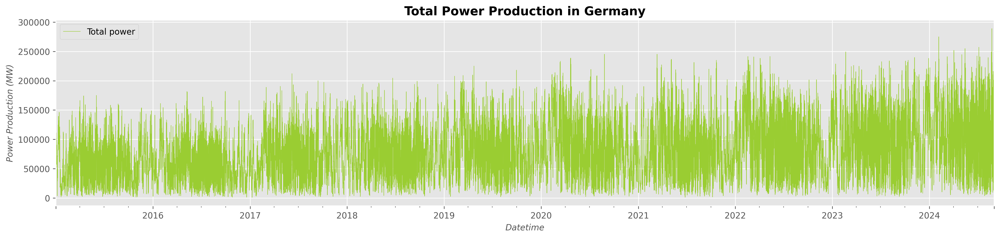

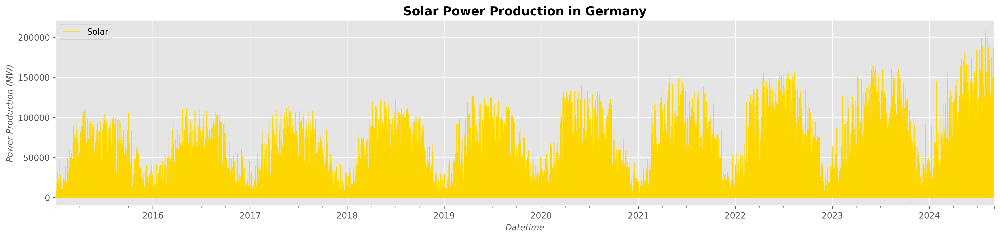

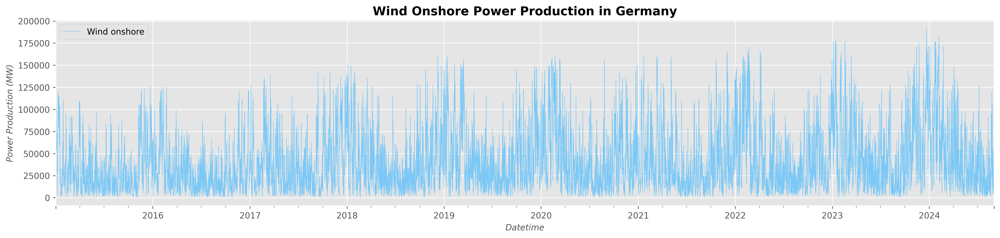

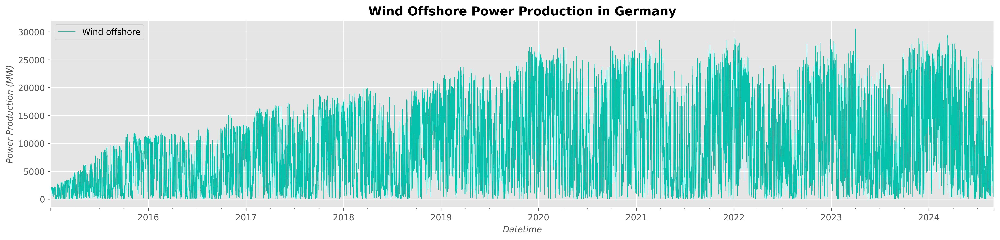

In [149]:
plot_data(df=df['Total power'], ttl='Total Power Production in Germany', linewidth=.5, color=c_br_green3, fig_sz=(20, 4))
plot_data(df=df['Solar'], ttl='Solar Power Production in Germany', linewidth=.5, color=c_yellow, fig_sz=(20, 4))
plot_data(df=df['Wind onshore'], ttl='Wind Onshore Power Production in Germany', linewidth=.5, color=c_blue, fig_sz=(20, 4))
plot_data(df=df['Wind offshore'], ttl='Wind Offshore Power Production in Germany', linewidth=.5, color=c_turq, fig_sz=(20, 4))

#### 2.1.3.2. Power Productions in a year 2023

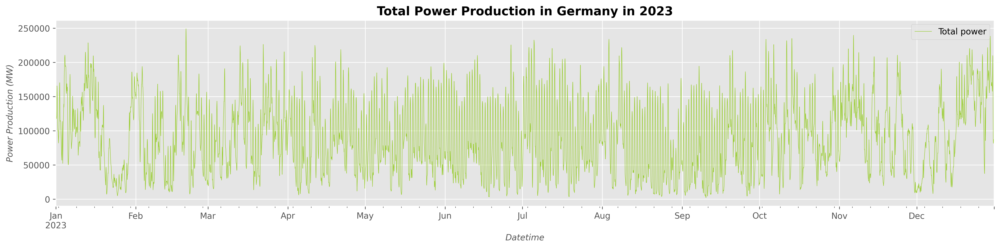

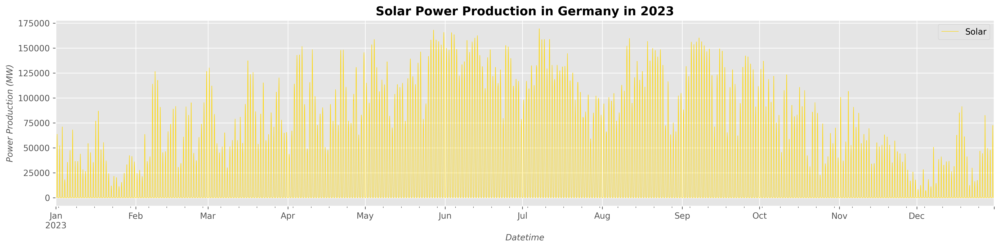

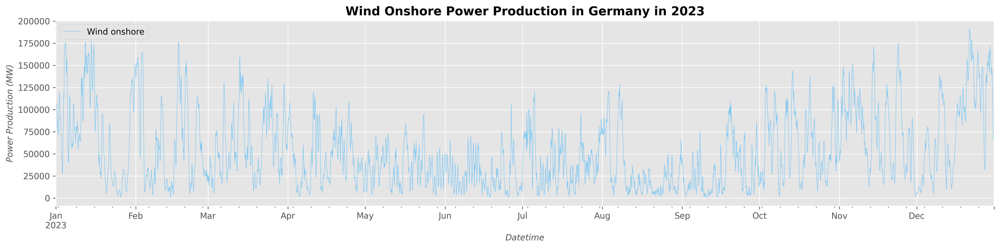

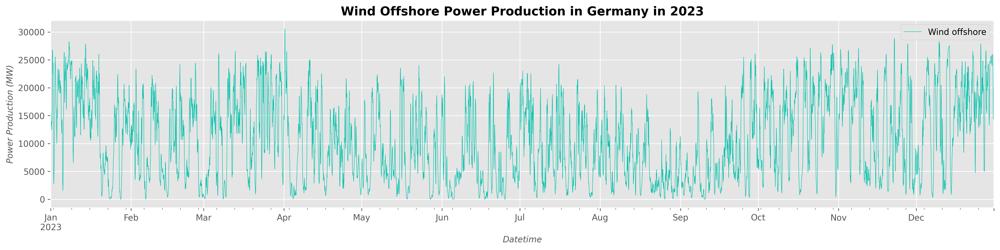

In [150]:
condition = (df.index >= "2023-01-01") & (df.index <= "2023-12-31")
base_ttl = ' Power Production in Germany in 2023'
plot_data(df=df['Total power'].loc[condition], ttl='Total' + base_ttl, linewidth=.5, color=c_br_green3, fig_sz=(20, 4))
plot_data(df=df['Solar'].loc[condition], ttl='Solar' + base_ttl, linewidth=.5, color=c_yellow, fig_sz=(20, 4))
plot_data(df=df['Wind onshore'].loc[condition], ttl='Wind Onshore' + base_ttl, linewidth=.5, color=c_blue, fig_sz=(20, 4))
plot_data(df=df['Wind offshore'].loc[condition], ttl='Wind Offshore' + base_ttl, linewidth=.5, color=c_turq, fig_sz=(20, 4))

#### 2.1.3.3. Power Productions in different parts of the year

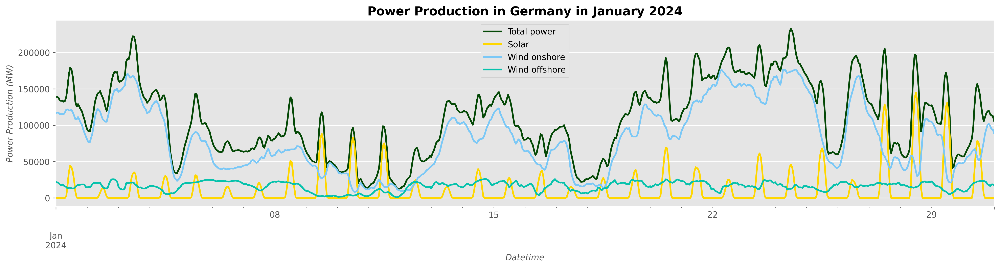

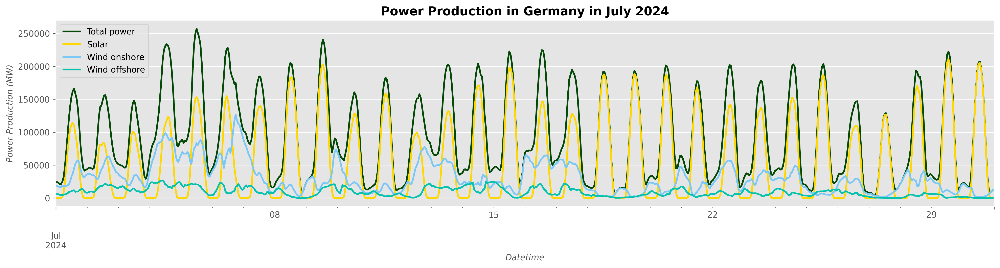

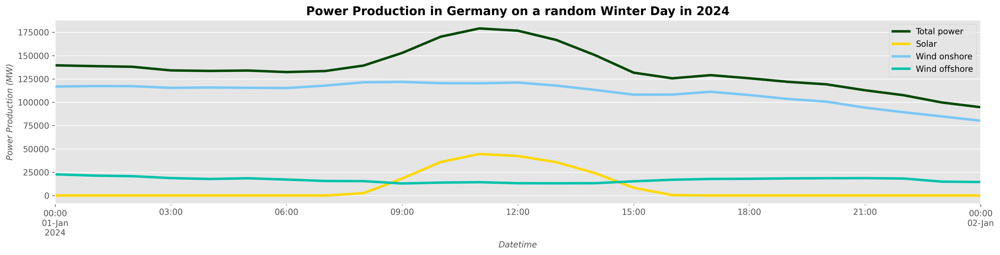

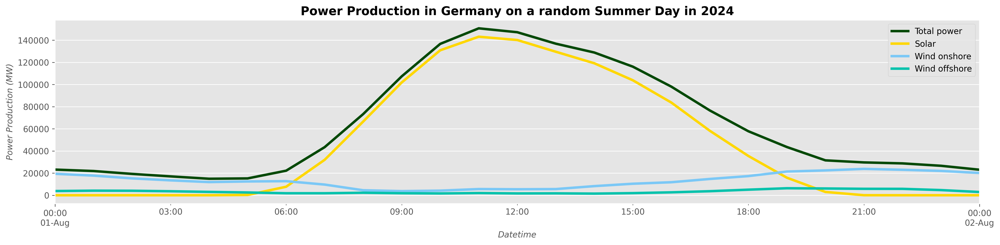

In [158]:
condition_w= (df.index >= "2024-01-01") & (df.index <= "2024-01-31")
condition_s= (df.index >= "2024-07-01") & (df.index <= "2024-07-31")
condition_w_d = (df.index >= "2024-01-01") & (df.index <= "2024-01-02")
condition_s_d = (df.index >= "2024-08-01") & (df.index <= "2024-08-02")

plot_data_2(condition_w, 'Power Production in Germany in January 2024', linewidth=2)
plot_data_2(condition_s, 'Power Production in Germany in July 2024', linewidth=2)
plot_data_2(condition_w_d, 'Power Production in Germany on a random Winter Day in 2024', linewidth=3)
plot_data_2(condition_s_d, 'Power Production in Germany on a random Summer Day in 2024', linewidth=3)


### 2.1.4. EDA Observations: Seasonality and Trend

1. Solar power production has a clear YEARLY seasonality. Values are significantly higher in the middle of the year and significantly lower in the beginning and end of the year. 

2. Solar power production has a clear DAILY seasonality. Values achieve their max in the middle of the year and ther min, 0 during the night, when there is no sun. 

3. As most of the total power production in the months of summer is produced by Solar energy, the total power data also displays a clear DAILY seasonality during this time. However, it does not show a clear YEARLY seasonality.

4. Cannot observe a clear increasing or decreasing trend for the overall power production. However, it seems to be a slight increasing trend over the years for the production of energy from these three renewable energy sources. This trend is particularly noticable for Solar Power Production, the mean yearly production seems to be incresing in the recent years, possibly indicating that Germany has significantly increased its capacity for solar power production in the last 4-5 years.

##### Extra figures to prodivde insights to the above seasonality and trends discussions

In [170]:
def trend_seas(df):
    
    seas_decomp = seasonal_decompose(df)
    seas_decomp.plot(observed = False)

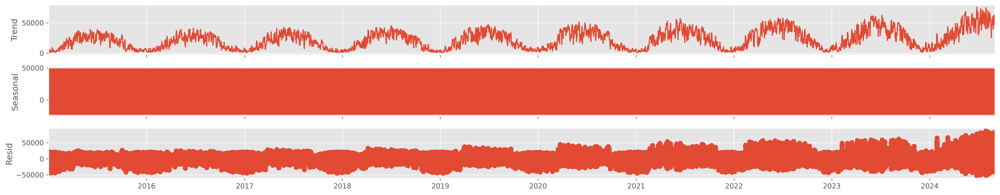

In [171]:
# Overall Solar Power Production
trend_seas(df[['Solar']])
# shows the slight increasing trend, too dense to show seasonality

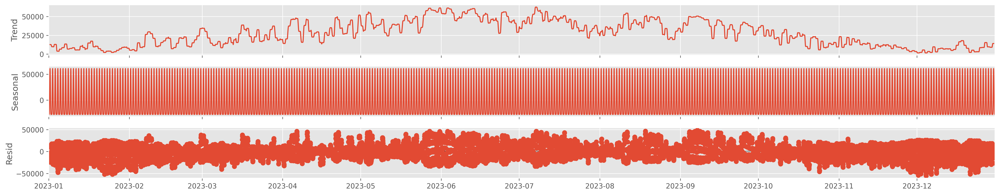

In [172]:
# Solar Power Production in a year 2023
trend_seas(df[['Solar']].loc[condition])
#shows the daily seasonality

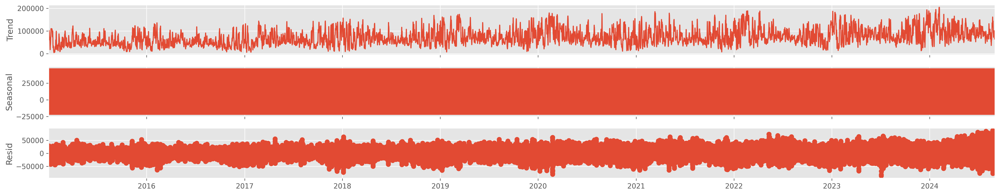

In [173]:
# Total Power Production over the years
trend_seas(df[['Total power']])
#shows a slight increasing trend

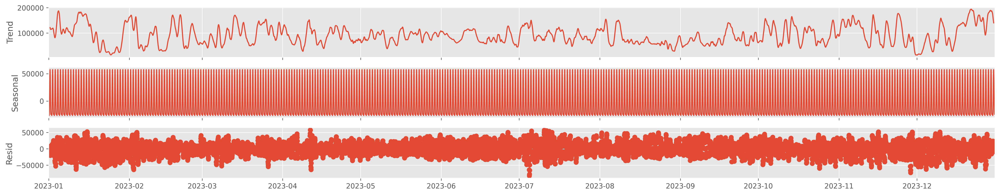

In [174]:
# Total Power Production in a year 2023
trend_seas(df[['Total power']].loc[condition])

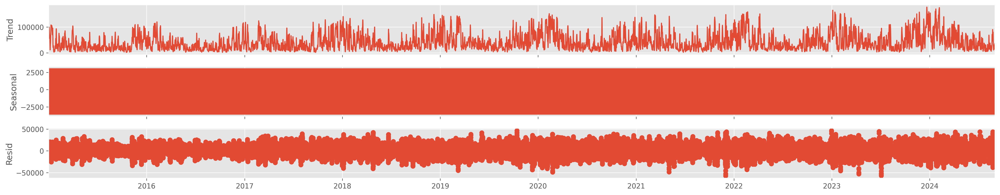

In [177]:
# Wind Onshore Power Production over the years
trend_seas(df[['Wind onshore']])

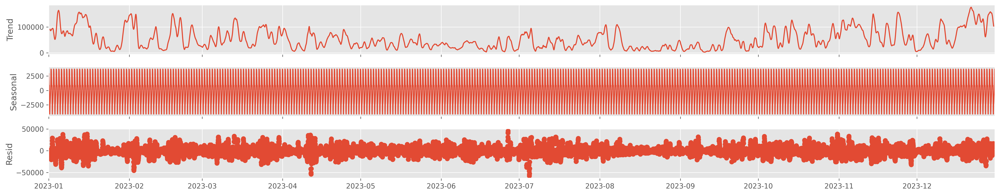

In [178]:
# Wind Onshore Power Production in a year 2023
trend_seas(df[['Wind onshore']].loc[condition])

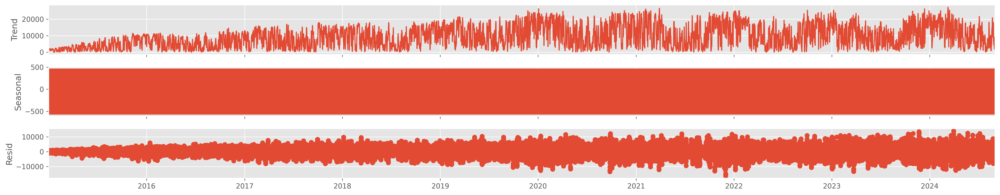

In [179]:
# Wind Offshore Power Production over the years
trend_seas(df[['Wind offshore']])

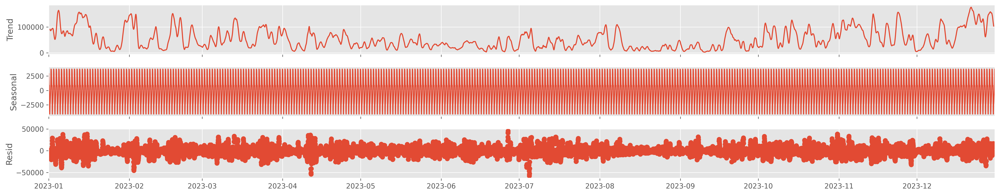

In [180]:
# Wind Offshore Power Production in a year 2023
trend_seas(df[['Wind onshore']].loc[condition])

### 2.1.5. EDA Observations: Stationarity vs Nonstationarity

1. Due to the clear presence of seasonality and a slight presence of an increasing trend in Solar Power Production over the years, this time series might be non-stationary.

2. Due to an absence of seasonality or trend for Wind onshore and Wind offshore power production, these time series might be stationary.

3. Overall, the total power production from these three renewable, eventhough it shows some daily seasonality during some times of the months (summer months when solar power accounts for the biggest part of the power production), overall it does not seem to show a clear seasonality or trend. This time series might be considered non-stationary. 

In [190]:
df1 = df.copy()

print('Mean over the years')
display(df1.groupby(df1.index.year).mean())
print('\n')
print('Std over the years')
display(df1.groupby(df1.index.year).std())

Mean over the years


,Wind offshore,Wind onshore,Solar,Total power
Datetime,,,,
2015,3727.127709,32384.077908,17047.607569,53158.813186
2016,5506.374898,30202.185974,16766.850159,52475.411031
2017,7951.596815,39403.197352,17352.053744,64706.847911
2018,8757.534692,40506.849144,19840.639737,69105.023573
2019,11131.963836,45281.279144,20243.835183,76657.078162
2020,12250.910121,46785.520890,22096.993511,81133.424522
2021,10965.753813,40411.872397,22594.519475,73972.145685
2022,11302.283801,44629.223413,26995.889475,82927.396689
2023,10744.749189,52922.831164,27404.565913,91072.146267




Std over the years


,Wind offshore,Wind onshore,Solar,Total power
Datetime,,,,
2015,3217.342816,27011.282004,25856.713936,35102.385916
2016,4028.287250,25148.646133,25670.542114,34731.365917
2017,5377.498636,31653.168829,26746.792423,40671.285744
2018,5855.030967,32034.478301,30201.010744,40978.626744
2019,6892.811513,34743.260050,30835.441762,44541.515565
2020,8007.737745,36841.624613,33673.188156,48226.958215
2021,8081.538998,33353.530653,34802.890175,47485.681860
2022,7568.121116,37184.894309,40521.204747,51033.879444
2023,7311.701789,41240.638674,41011.334199,53247.767943


#### 2.1.5. Tests to determine STATIONARITY for the data

In [222]:
# cond= (df.index >= "2024-07-01") & (df.index <= "2024-07-02")

# Augmented Dickey-Fuller test to check weather ts is stationary or not
# It determines how strongly a time series is defined by a trend.

def determine_stationarity(name, dataframe):
    display(name)
    result = adfuller(dataframe)
    p = result[1]
    print(f'p-value: for {name} series is: {p}')
    if p > 0.05:
        print(f"The {name} series is non-stationary")
    else:
        print(f"The {name} series is stationary")

dic = {
    'Total Power Production' : df[['Total power']],
    'Solar Power Production' : df[['Solar']],
    'Wind Onshore Power Production' : df[['Wind onshore']],
    'Wind Offshore Power Production' : df[['Wind offshore']]
}

for name, dataframe in dic.items():
    determine_stationarity(name, dataframe)

'Total Power Production'

p-value: for Total Power Production series is: 0.0
The Total Power Production series is stationary


'Solar Power Production'

p-value: for Solar Power Production series is: 1.0595971665373174e-15
The Solar Power Production series is stationary


'Wind Onshore Power Production'

p-value: for Wind Onshore Power Production series is: 0.0
The Wind Onshore Power Production series is stationary


'Wind Offshore Power Production'

p-value: for Wind Offshore Power Production series is: 0.0
The Wind Offshore Power Production series is stationary
